In [1]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn.decomposition as decomp
import sklearn.preprocessing as pp
import tensorly as tl
import tensorly.decomposition as tldec
from sklearn.cluster import DBSCAN as DBS
from sklearn.cluster import AgglomerativeClustering as AC
from sklearn.cluster import KMeans as KM
from sklearn.cluster import SpectralClustering as SC
from sklearn.metrics import (
    calinski_harabasz_score,
    davies_bouldin_score,
    silhouette_score,
)
from sklearn.mixture import BayesianGaussianMixture as BGM
from sklearn.mixture import GaussianMixture as GM

plt.rcParams["figure.dpi"] = 300
plt.rcParams["savefig.dpi"] = 300
sns.set_palette("magma")
warnings.filterwarnings("ignore")

Data is down sampled for presentation purposes.

In [2]:
# df_np = np.load("df_tensor.npy")

# r_index = np.random.choice(df_np.shape[0], size=5000, replace=False)
# df_np = df_np[r_index, :]

# np.save("df_sampled", df_np)

In [3]:
df_np = np.load("df_sampled.npy")

In [4]:
df_scaled = pp.MinMaxScaler().fit_transform(pp.StandardScaler().fit_transform(df_np))

In [5]:
%%time
df_kPCA = decomp.KernelPCA(n_components=3).fit_transform(df_scaled)

CPU times: user 11.5 s, sys: 910 ms, total: 12.4 s
Wall time: 1.66 s


In [6]:
df_PCA_pd = pd.DataFrame(df_kPCA, columns=["PCA1", "PCA2", "PCA3"])

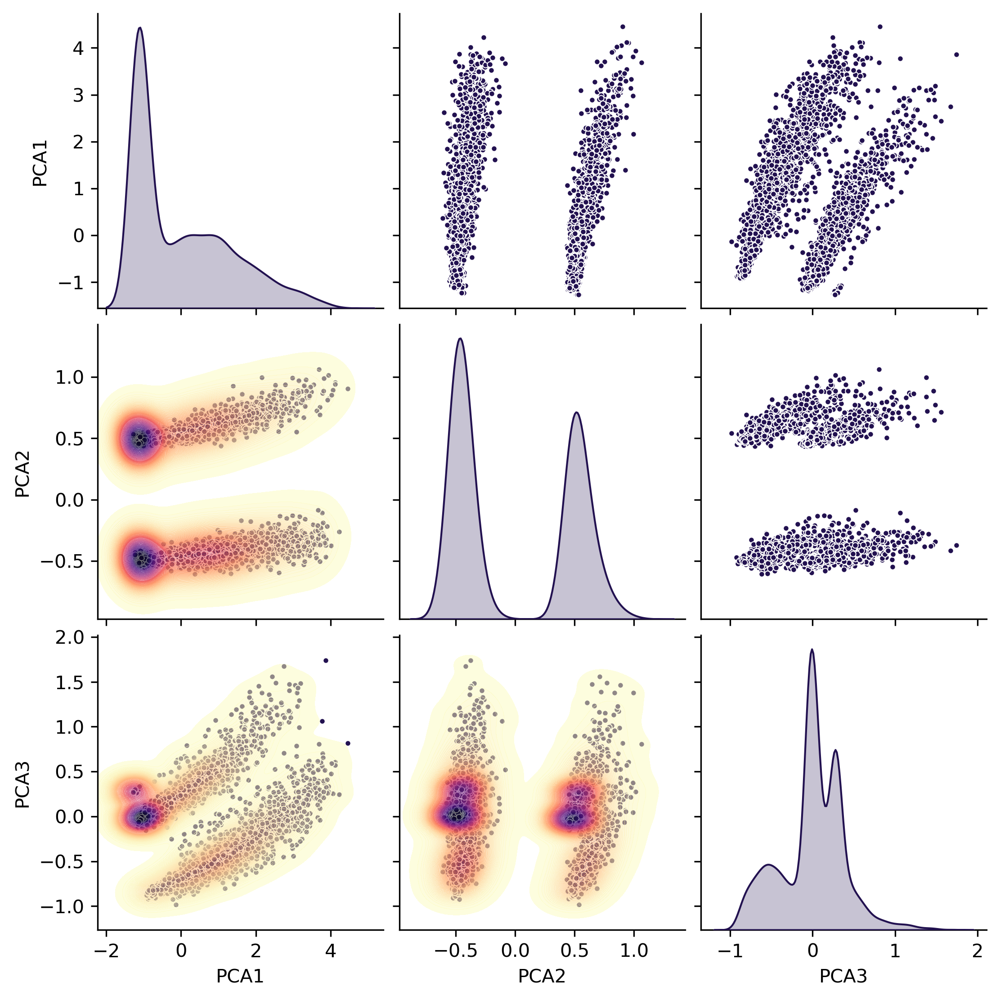

In [7]:
g = sns.pairplot(df_PCA_pd, diag_kind="kde", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100, thresh=0.002)

0.04623701725291276
1.2003968728992047
636.3456584282204


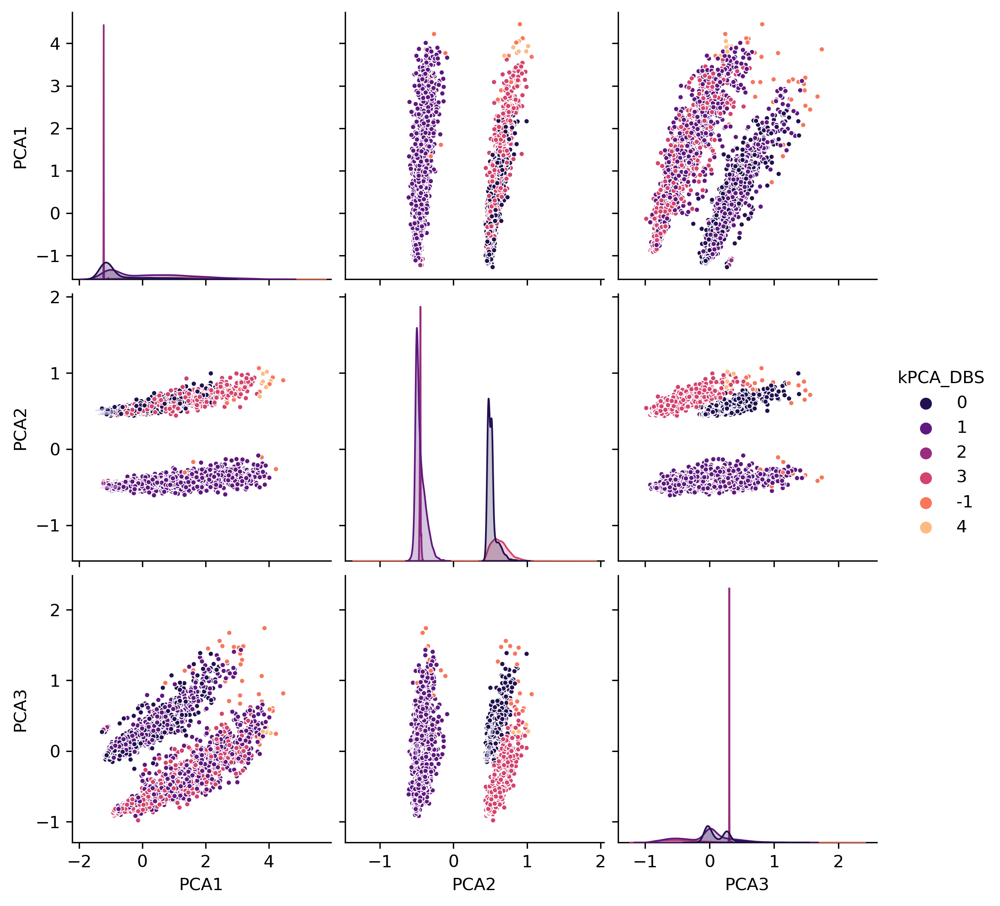

In [96]:
cl_ = DBS(eps=0.248).fit_predict(df_kPCA)
df_PCA_pd["kPCA_DBS"] = cl_.astype(str)

g = sns.pairplot(df_PCA_pd, hue="kPCA_DBS", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100)
print(silhouette_score(df_kPCA, df_PCA_pd.kPCA_DBS))
print(davies_bouldin_score(df_kPCA, df_PCA_pd.kPCA_DBS))
print(calinski_harabasz_score(df_kPCA, df_PCA_pd.kPCA_DBS))

0.40713940612881744
1.3359032123812262
2094.5627884348332


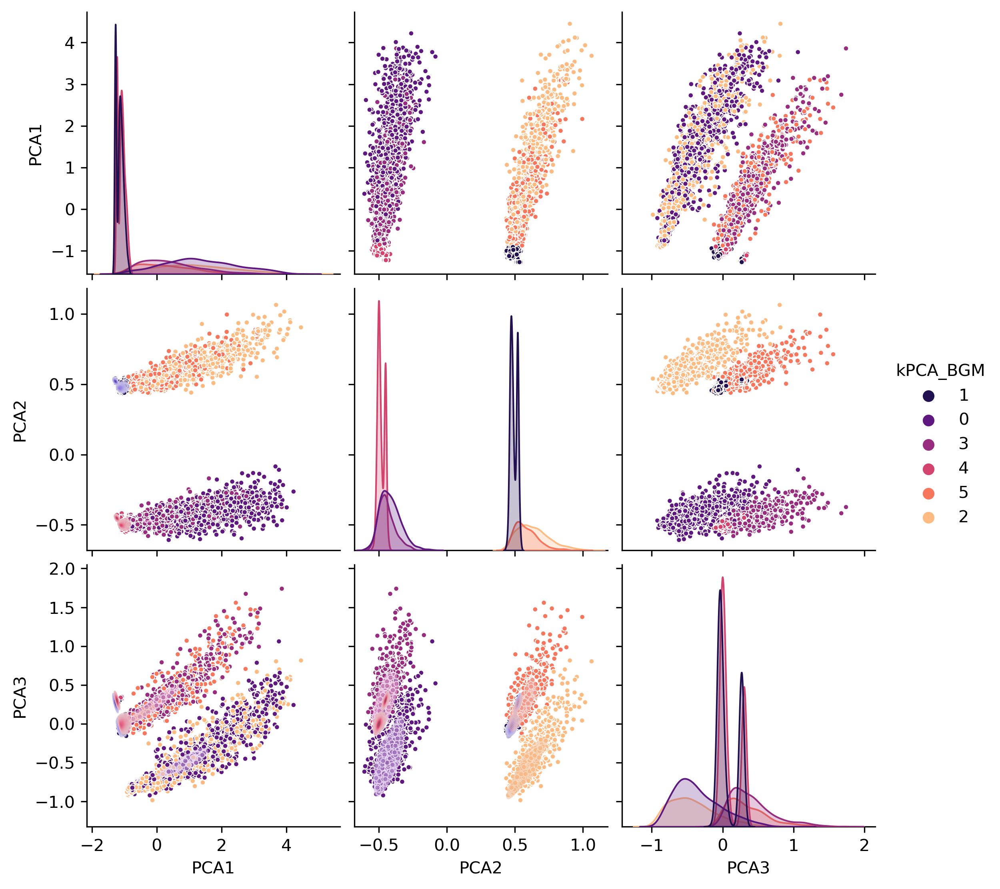

In [97]:
cl_ = BGM(n_components=6).fit_predict(df_kPCA)
df_PCA_pd["kPCA_BGM"] = cl_.astype(str)

g = sns.pairplot(df_PCA_pd, hue="kPCA_BGM", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100)
print(silhouette_score(df_kPCA, df_PCA_pd.kPCA_BGM))
print(davies_bouldin_score(df_kPCA, df_PCA_pd.kPCA_BGM))
print(calinski_harabasz_score(df_kPCA, df_PCA_pd.kPCA_BGM))

In [10]:
# %%time
df_NMF = decomp.NMF(n_components=3, init="nndsvda", max_iter=700).fit_transform(
    df_scaled
)

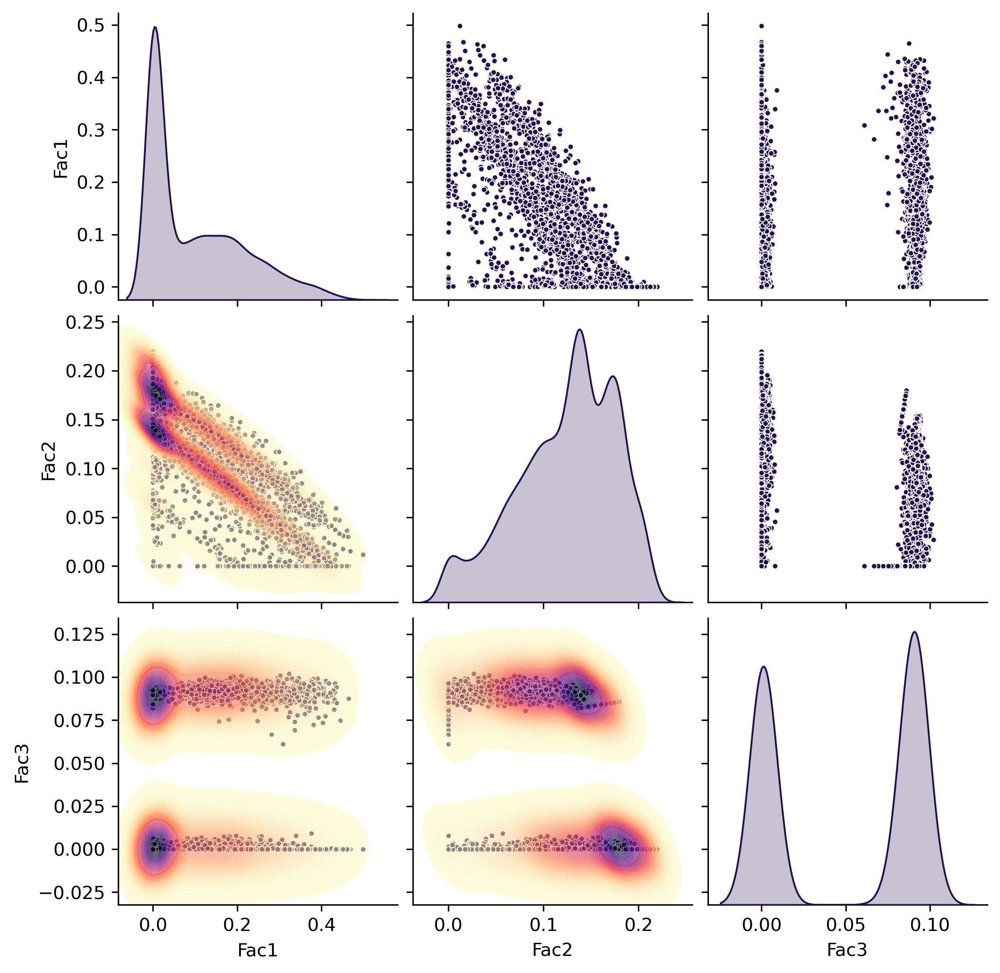

In [11]:
df_NMF_pd = pd.DataFrame(df_NMF, columns=["Fac1", "Fac2", "Fac3"])
g = sns.pairplot(df_NMF_pd, diag_kind="kde", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100, thresh=0.002)

0.3596355517597736
2.6391477829328918
1528.52706823842


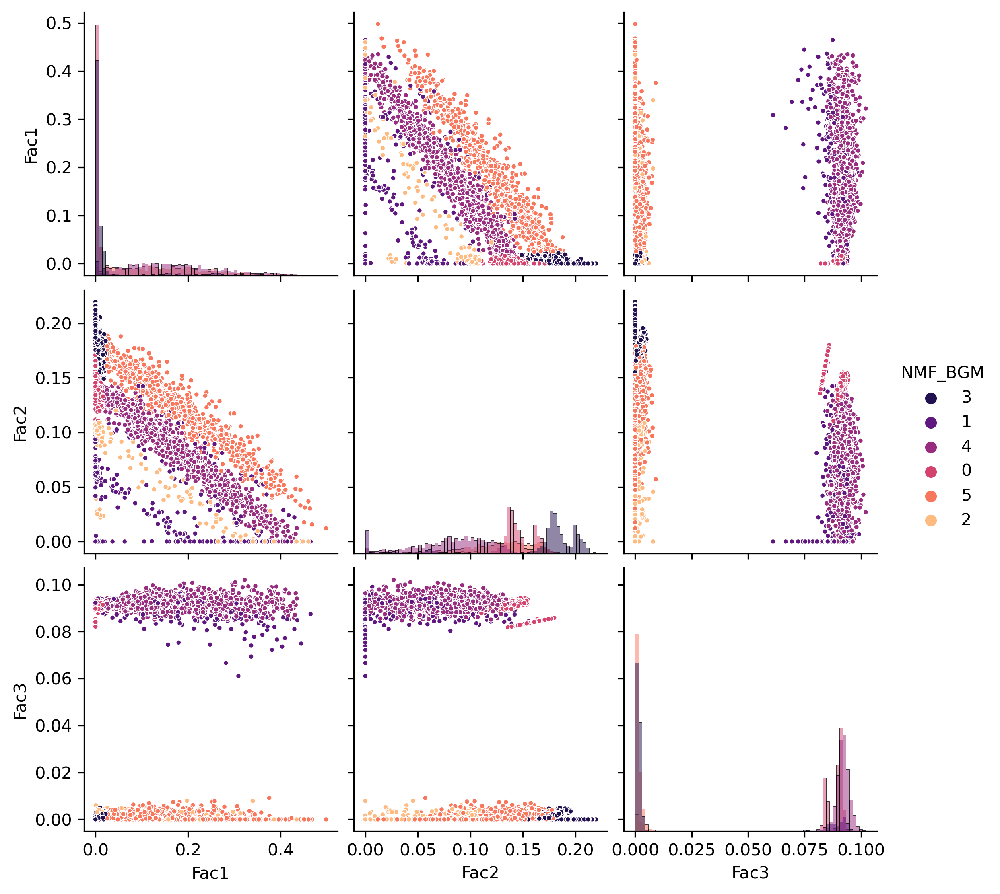

In [12]:
cl_ = BGM(n_components=6).fit_predict(df_NMF)
df_NMF_pd["NMF_BGM"] = cl_.astype(str)

g = sns.pairplot(
    df_NMF_pd, hue="NMF_BGM", markers=".", diag_kind="hist", diag_kws={"bins": 70}
)
# g.map_lower(sns.kdeplot, cmap='magma_r', fill=True, alpha=0.5, levels=100)
print(silhouette_score(df_NMF, df_NMF_pd["NMF_BGM"]))
print(davies_bouldin_score(df_NMF, df_NMF_pd["NMF_BGM"]))
print(calinski_harabasz_score(df_NMF, df_NMF_pd["NMF_BGM"]))

In [13]:
# %%time
df_fICA = decomp.FastICA(n_components=3).fit_transform(df_scaled)

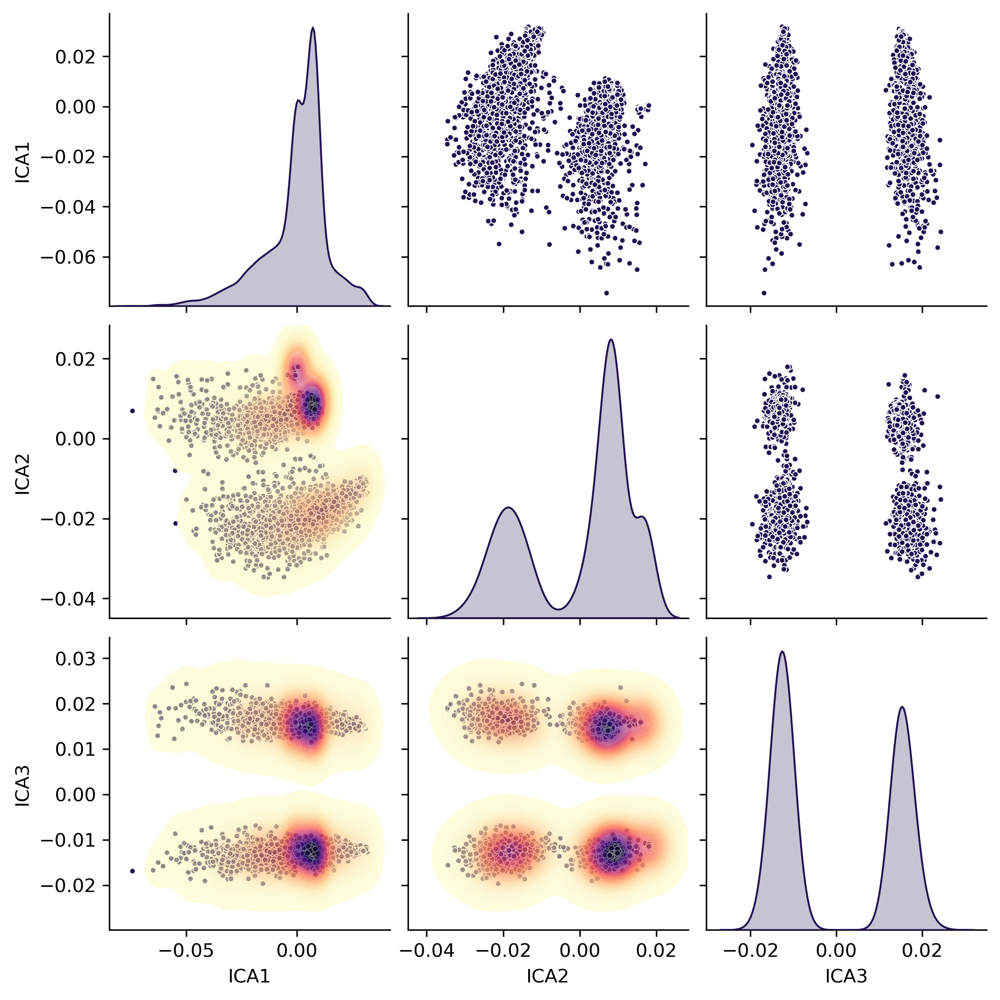

In [14]:
df_ICA_pd = pd.DataFrame(df_fICA, columns=["ICA1", "ICA2", "ICA3"])
g = sns.pairplot(df_ICA_pd, diag_kind="kde", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100, thresh=0.002)

0.789480465869768
0.28811839864713473
26236.870832346805


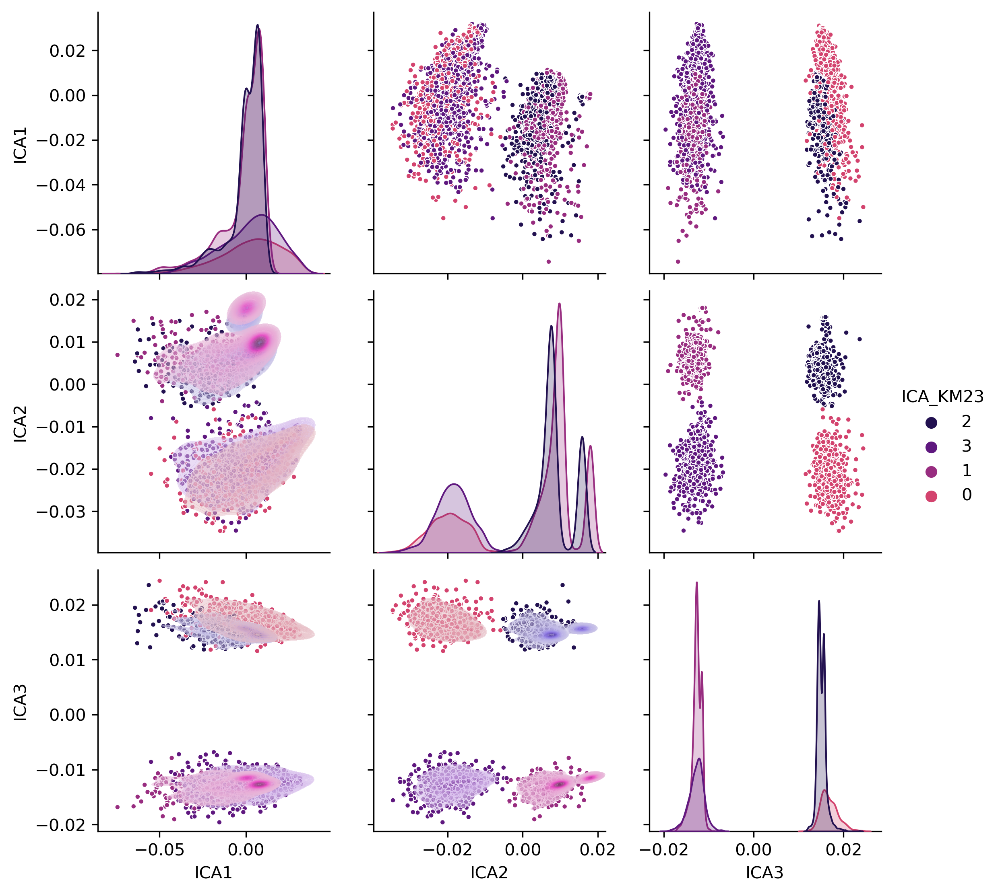

In [15]:
cl_ = KM(n_clusters=4).fit_predict(df_fICA[:, 1:])
df_ICA_pd["ICA_KM23"] = cl_.astype(str)

g = sns.pairplot(df_ICA_pd, hue="ICA_KM23", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100)
print(silhouette_score(df_fICA[:, 1:], df_ICA_pd["ICA_KM23"]))
print(davies_bouldin_score(df_fICA[:, 1:], df_ICA_pd["ICA_KM23"]))
print(calinski_harabasz_score(df_fICA[:, 1:], df_ICA_pd["ICA_KM23"]))

### Tensor Decomp

In [16]:
df_tens = df_scaled.reshape((5000, 52, 199))

In [17]:
weights, factors = tldec.parafac(df_tens, rank=3)
df_PFA = np.array(factors[0])

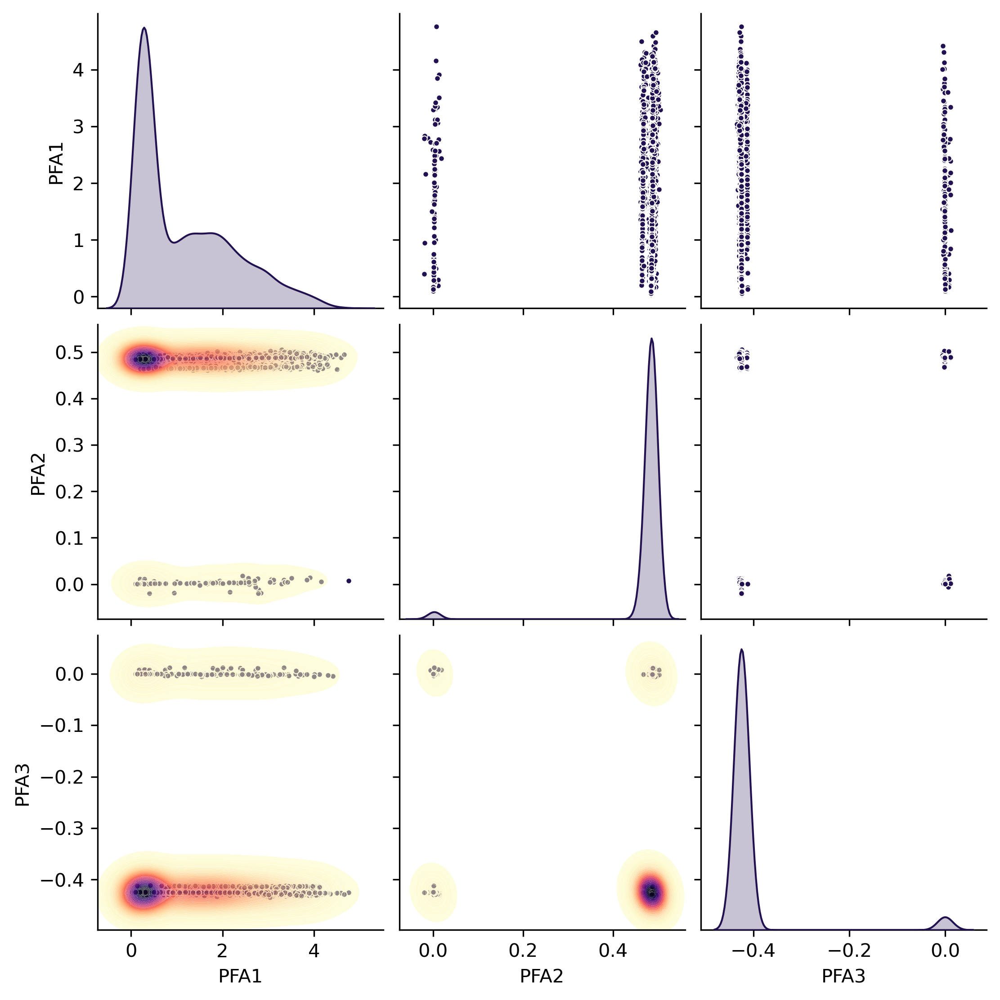

In [18]:
df_PFA_pd = pd.DataFrame(df_PFA, columns=["PFA1", "PFA2", "PFA3"])
g = sns.pairplot(df_PFA_pd, diag_kind="kde", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100, thresh=0.002)

0.3858661450363215
2.6997387641095156
2730.6005576894263


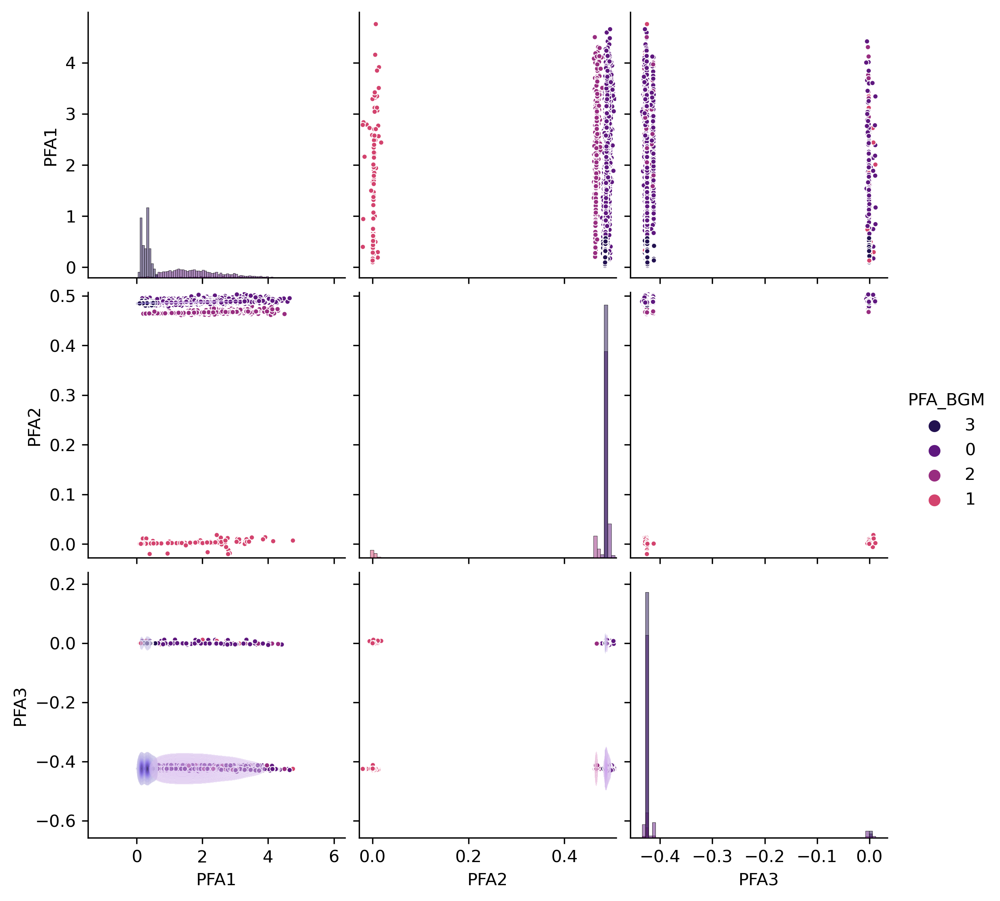

In [19]:
cl_ = BGM(n_components=4, max_iter=600).fit_predict(df_PFA[:, :-1])
df_PFA_pd["PFA_BGM"] = cl_.astype(str)

g = sns.pairplot(
    df_PFA_pd, hue="PFA_BGM", markers=".", diag_kind="hist", diag_kws={"bins": 70}
)
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100)
print(silhouette_score(df_PFA[:, :-1], df_PFA_pd["PFA_BGM"]))
print(davies_bouldin_score(df_PFA[:, :-1], df_PFA_pd["PFA_BGM"]))
print(calinski_harabasz_score(df_PFA[:, :-1], df_PFA_pd["PFA_BGM"]))

In [20]:
# %%time
df_PF2 = tldec.parafac2(df_tens, rank=3, tol=0.0022, n_iter_max=45).factors[0]

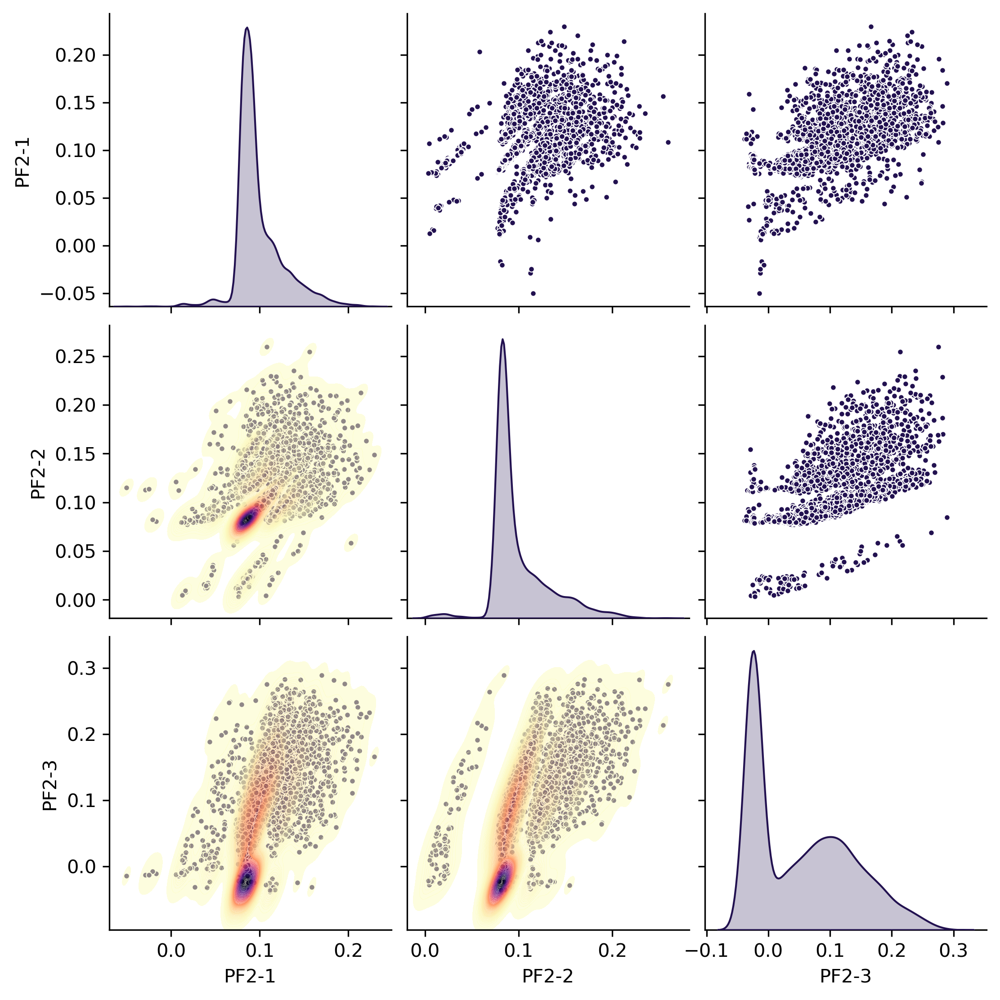

In [21]:
df_PF2_pd = pd.DataFrame(df_PF2, columns=["PF2-1", "PF2-2", "PF2-3"])
g = sns.pairplot(df_PF2_pd, diag_kind="kde", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100, thresh=0.002)

0.4130818637299664
1.6916505316628645
3479.521438254871


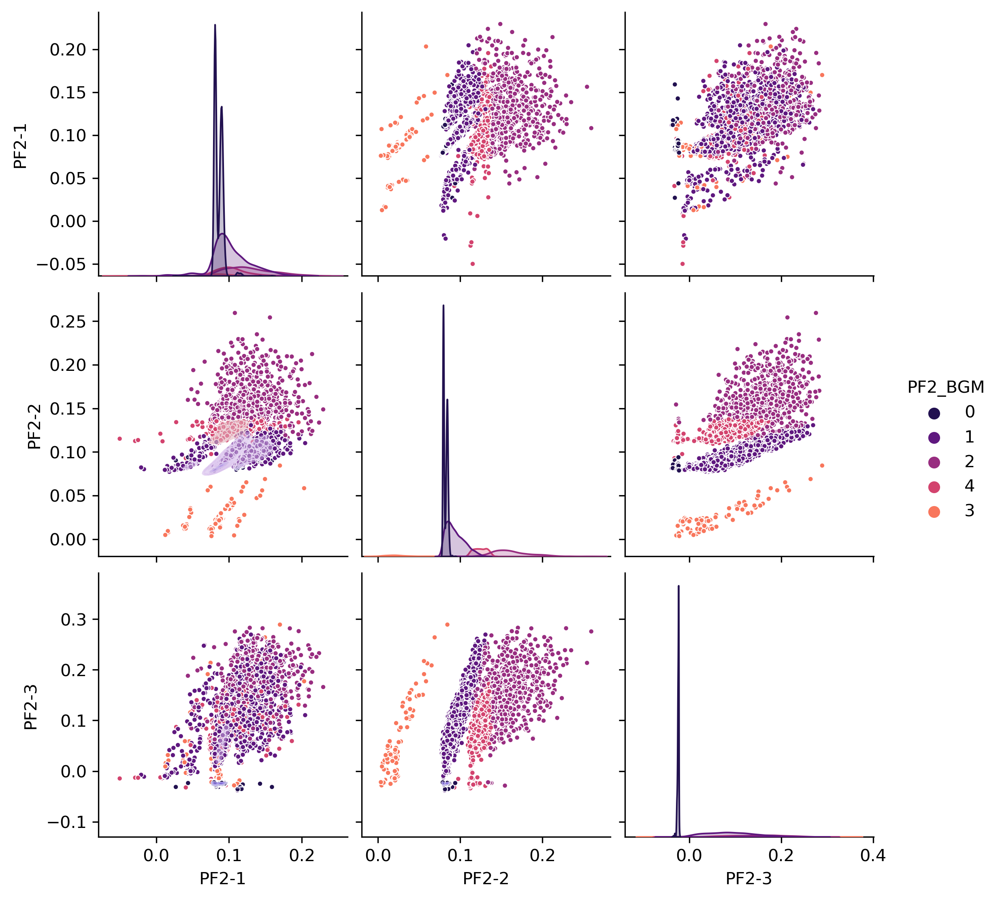

In [22]:
cl_ = BGM(n_components=5, max_iter=600).fit_predict(df_PF2[:, 1:])
df_PF2_pd["PF2_BGM"] = cl_.astype(str)

g = sns.pairplot(df_PF2_pd, hue="PF2_BGM", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100)
print(silhouette_score(df_PF2[:, 1:], df_PF2_pd["PF2_BGM"]))
print(davies_bouldin_score(df_PF2[:, 1:], df_PF2_pd["PF2_BGM"]))
print(calinski_harabasz_score(df_PF2[:, 1:], df_PF2_pd["PF2_BGM"]))

In [24]:
# Already Implemented as `parafac`

# %%time
# df_CP = (
#     tldec.CP(rank=3, normalize_factors=False, orthogonalise=False)
#     .fit_transform(df_tens)
#     .factors[0]
# )

# df_CP_pd = pd.DataFrame(df_CP, columns=["CP1", "CP2", "CP3"])
# g = sns.pairplot(df_CP_pd, diag_kind="kde", markers=".")
# g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100, thresh=0.002)

# cl_ = BGM(n_components=5).fit_predict(df_CP)
# df_CP_pd["CP_BGM"] = cl_.astype(str)
# g = sns.pairplot(df_CP_pd, hue="CP_BGM", markers=".")
# g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100)
# print(silhouette_score(df_CP, df_CP_pd["CP_BGM"]))
# print(davies_bouldin_score(df_CP, df_CP_pd["CP_BGM"]))
# print(calinski_harabasz_score(df_CP, df_CP_pd["CP_BGM"]))

In [25]:
# %%time
df_TKR = tldec.Tucker(rank=(3)).fit_transform(df_tens).factors[0]

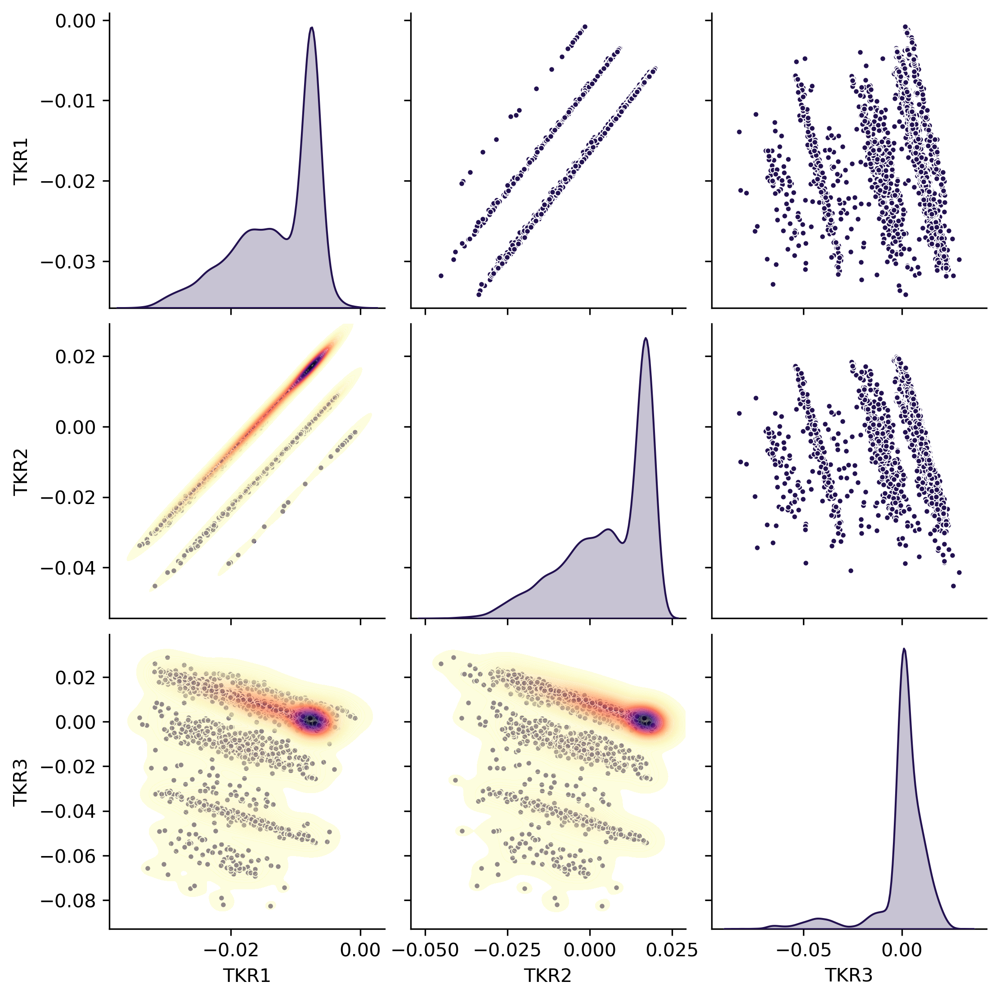

In [26]:
df_TKR_pd = pd.DataFrame(df_TKR, columns=["TKR1", "TKR2", "TKR3"])
g = sns.pairplot(df_TKR_pd, diag_kind="kde", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100, thresh=0.002)

0.4929097092116359
1.9827530017687476
2999.9649458349754


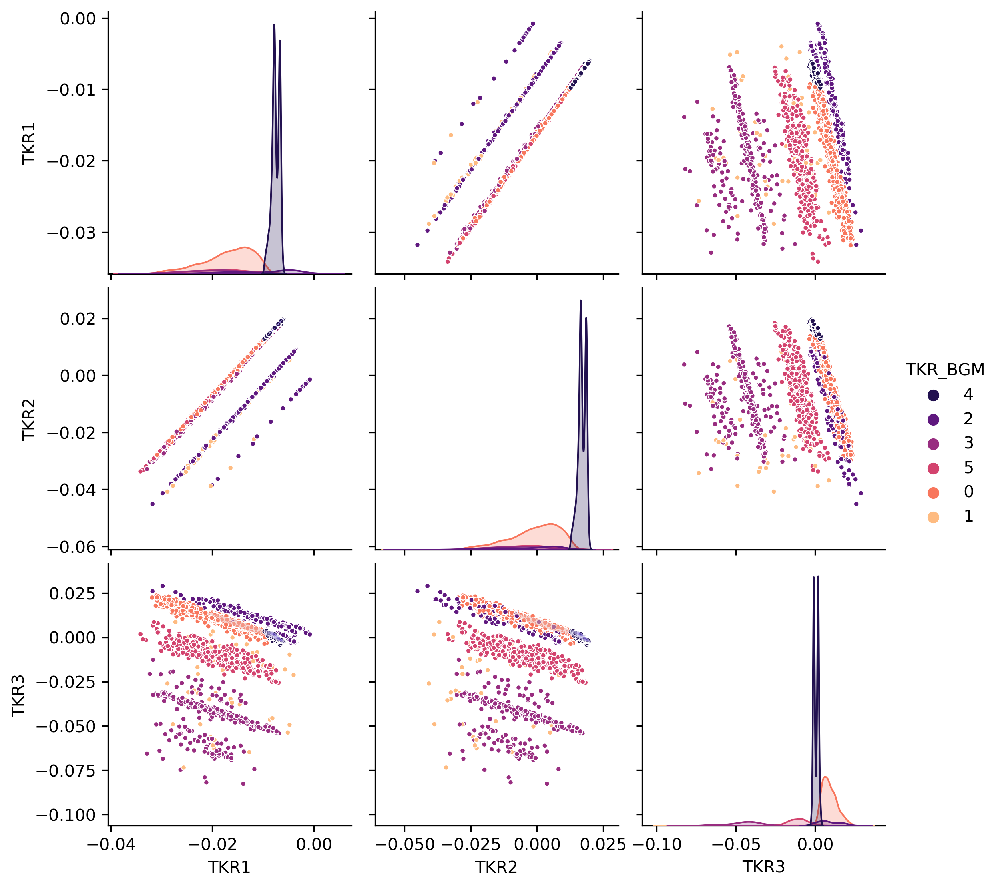

In [30]:
cl_ = BGM(n_components=6).fit_predict(df_TKR)
df_TKR_pd["TKR_BGM"] = cl_.astype(str)

g = sns.pairplot(df_TKR_pd, hue="TKR_BGM", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5)
print(silhouette_score(df_TKR, df_TKR_pd["TKR_BGM"]))
print(davies_bouldin_score(df_TKR, df_TKR_pd["TKR_BGM"]))
print(calinski_harabasz_score(df_TKR, df_TKR_pd["TKR_BGM"]))

In [31]:
# %%time
_, factors = tldec.non_negative_tucker(df_tens, rank=3)
df_NNT = np.array(factors[0])

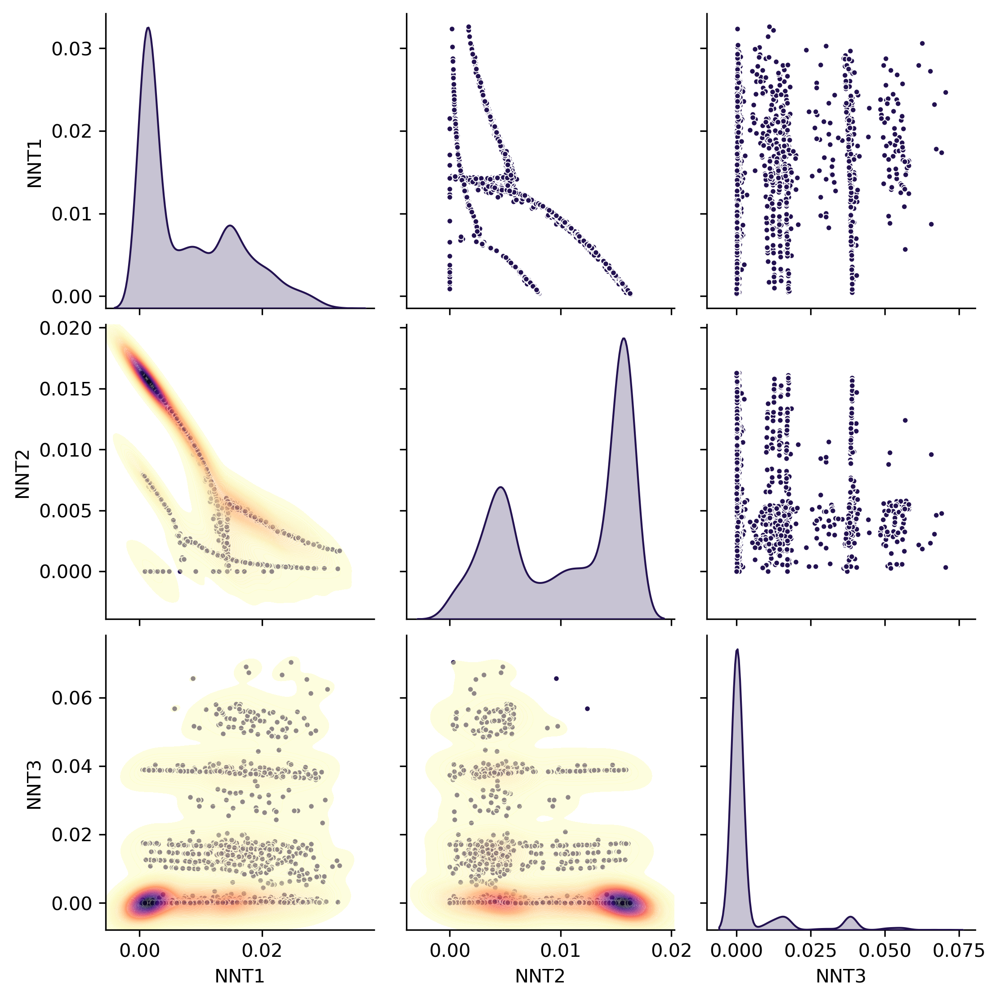

In [32]:
df_NNT_pd = pd.DataFrame(df_NNT, columns=["NNT1", "NNT2", "NNT3"])
g = sns.pairplot(df_NNT_pd, diag_kind="kde", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100, thresh=0.002)

0.6055589905062869
0.7292149399810774
6870.611783612127


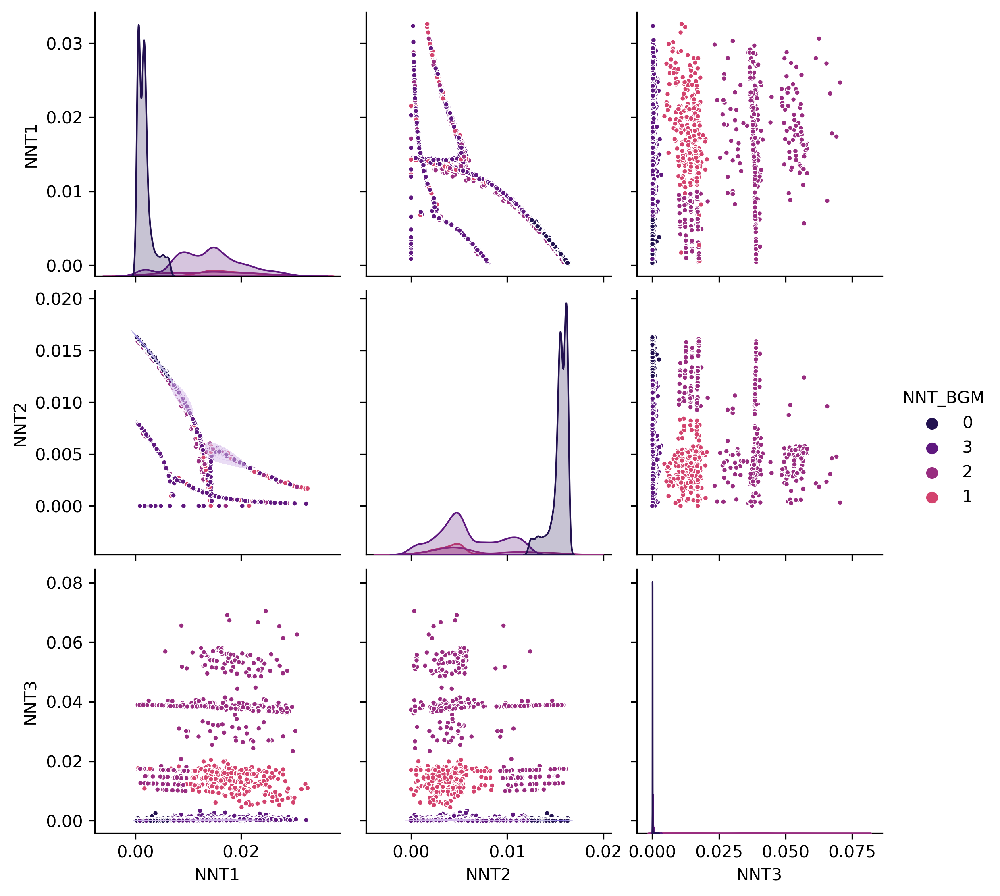

In [33]:
cl_ = BGM(n_components=4).fit_predict(df_NNT)
df_NNT_pd["NNT_BGM"] = cl_.astype(str)

g = sns.pairplot(df_NNT_pd, hue="NNT_BGM", markers=".")
g.map_lower(sns.kdeplot, cmap="magma_r", fill=True, alpha=0.5, levels=100)
print(silhouette_score(df_NNT, df_NNT_pd["NNT_BGM"]))
print(davies_bouldin_score(df_NNT, df_NNT_pd["NNT_BGM"]))
print(calinski_harabasz_score(df_NNT, df_NNT_pd["NNT_BGM"]))

In [ ]:
# best_err = np.inf
# decomposition = None

# for run in range(2):
#     print(f'Training model {run}...')
#     trial_decomposition, trial_errs = tldec.parafac2(df_tens, 2, return_errors=True, tol=1e-8, n_iter_max=40)
#     print(f'Number of iterations: {len(trial_errs)}')
#     print(f'Final error: {trial_errs[-1]}')
#     if best_err > trial_errs[-1]:
#         best_err = trial_errs[-1]
#         err = trial_errs
#         decomposition = trial_decomposition
#     print('-------------------------------')
# print(f'Best model error: {best_err}')